# **Lab 4: FIR filters and envelopes**

The goal of this lab is to learn how to implement FIR filters in Python, and how we can use them to improve our synthesis.

Authors:
*   Marc Bosch Manzano. U215231.
*   Arnau Balart Correa. U162432.

Delivered Date: 20/11/2024.

In [36]:
# IMPORTANT: Flags for the conditional imports
google_colab = True
authors = True

In [37]:
if (not authors) or google_colab:
    folder = 'sis1_group2/audio/'
    !git clone https://github.com/u215231/sis1_group2.git
    from sis1_group2.util import (load_audio, plot_signals, plot_spectrogram,
                                 plot_mean_spectrogram, plot_spectrum_at)
else:
    folder = 'audio/'
    from util import (load_audio, plot_signals, plot_spectrogram,
                      plot_mean_spectrogram, plot_spectrum_at)
import os
import numpy as np
import librosa
import IPython.display as ipd
import matplotlib.pyplot as plt
from IPython.display import Audio
from scipy import signal

fatal: destination path 'sis1_group2' already exists and is not an empty directory.


**1. Overview of Filtering**

For this lab, we will define an FIR filter as a discrete-time system that converts an input signal $x[n]$ into an output signal $y[n]$ by means of the weighted summation:

$$
y[n] = \sum_{k=0}^M b_kx[n-k]
$$

The function *np.convolve()* is a generic function with which to implement FIR filters. The following code implements a three-point averaging system:

In [38]:
fs = 1
x = [np.floor(x/10) for x in range(50)]
b = 1/3 * np.array([1.0, 1.0, 1.0])
syn = np.convolve(b, x)

plot_signals([x, syn], fs, name=['input x[n]', 'output y[n]'], mode='lines+markers')

1.1 Explain the filtering action of the 5-point averager by comparing the plot of the input $x[n]$ and the output $y[n]$. This filter might be called a “smoothing” filter. Note how the transitions from one level to another have been “smoothed.”

The 5-point averager, is used to smooth or average a signal. It operates by averaging the current sample and four previous samples from the input signal to create a smoother output. This filtering action reduces the impact of high-frequency noise and sharp transitions in the input. We can see this from the example above by noteching how the transitions last longer and have less of an angle of attack. It's an overall smoother graphic than the blue one.

1.2 Define a function `averaging_filter(x, N)` which implements the N-points averaging filter using the `np.convolve` function.

In [39]:
def averaging_filter(x, N):
    b = np.ones(N) / N
    y = np.convolve(b, x, mode='valid')
    return y

1.3 Run the example above using the `averaging_filter` instead. Change the number N to different values and explain what happen.

In [40]:
a = averaging_filter(x, 5)
b = averaging_filter(x, 6)
c = averaging_filter(x, 7)
plot_signals([a, b, c], fs, name=['N = 5', 'N = 6', 'N = 7'], mode='lines+markers')

We obtain a smooth representation of the original "x" signal when we apply the averaging filter to it. As the bigger the N value is, the shape of the signal tens to its intrinsic shape, which is an increasing line.

1.4 How would you classify this filter, as a low-pass o high-pass filter?

It smooths the signal by averaging a range of samples, which effectively reduces the impact of high-frequency noise or rapid changes in the signal. This behavior makes it a low-pass filter, as it passes the lower-frequency components and attenuates the higher-frequency components, resulting in a smoother signal.







---

**2. Envelope detector**

Now we'll implement an envelope detector by concatenating two systems: a full-wave rectifier (absolute value) and the N-point averaging filter.

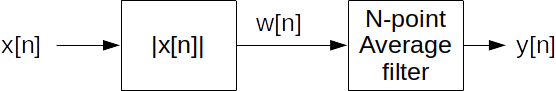

2.1 Define a function `envelope(x, N)` which applies an N-point averaging filter to the full-wave rectified signal and returns the output $y[n]$.

**Note 1**: to calculate the full-wave rectified signal check the `np.abs()` function.

**Note 2**: The output should have the same length as the input signal. Use 'same' mode (see [np.convolve](https://numpy.org/doc/stable/reference/generated/numpy.convolve.html) documentation).

In [41]:
def envelope(x, N):
    if N < 1:
      raise ValueError("N must be at least 1")
    rectified_signal = np.abs(x)
    filter_coeffs = np.ones(N) / N
    envelope_signal = np.convolve(rectified_signal, filter_coeffs, mode='same')
    return envelope_signal

2.2 Load your reference signal and calculate its envelope using the function you designed. Plot the reference signal and envelope in the same figure.

In [42]:
# Load reference signal
filepath = folder + "piano-a4-sound.wav"
ref, fs = load_audio(filepath)

# Reference signal parameters
fs = 44100
f0 = 440
T0 = 1/f0

# Compute envelope
env = 2.0 * envelope(ref, N=500)

In [43]:
num_periods_shown = 800
t_start = 0.1
t_end = t_start + T0*num_periods_shown

plot_signals([ref, env], fs, t_start=t_start, t_end=t_end,
             name=['normal signal', 'envelope'], mode='lines+markers')

2.3 Change the number N to get a good result. What happens when you change the number N?

The more we increase the number N, the more the envelope signal follows the outer shape of the original one. The envelope has less variation, that is, it is more blure as N inceases. Here, with N=1000, we can osberve the exponential behaviour of the fade out this piano note.

2.4 Explain with your own words why this system achieves extracting the envelope. It might be useful to plot together the signals $x[n]$, $w[n]$ and $y[n]$.

In [44]:
plot_signals([ref, abs(ref), env], fs, t_start=t_start, t_end=t_end,
             name=['normal signal', 'abs', 'envelope'], mode='lines+markers')

We can see that the shape of the envelope is the same as the absolute value of of the original signal. In other worrds, the envolepe sorround the absolute value signal.

2.5 Now let's apply this envelope to the synthesized signal. Copy the code from Lab3 Ex. 2.1 and generate the synthesized signal. Then multiply the synthesized signal by the envelope. Note that both signal and envelope should have the same length. You can define a time vector of the same length of the envelope to create the signal:

In [45]:
def synthesize(f0, phi, Ak, t):
  y = 0
  for k in range(1, 9 + 1):
    y += Ak[k-1] * np.cos(2*np.pi*k*f0*t + k*phi - (k-1)*np.pi/2)
  return y

In [46]:
# Sample Frequency-Amplitude pairs
spectrum = np.array([
    [441.43, 0.1292],
    [882.86, 1.0000],
    [1324.3, 0.04595],
    [1771.1, 0.04656],
    [2223.3, 0.09470],
    [2675.5, 0.04684],
    [3138.5, 0.009089],
    [3601.4, 0.002395],
    [3999.8, 0.001157]
])

# Select only the amplitudes
weights = spectrum[:, 1]

# Create the synthethized signal
time = np.arange(0, ref.shape[0]/fs, 1.0/fs)
syn = synthesize(440, np.pi + 0.9, weights, time)

# Normalize the synthesis and multiply it by the envelope
A0 = 0.16
syn = env * (A0 * (syn / np.max(syn)))

In [47]:
num_periods_shown = 300
t_start = 0.0
t_end = t_start + T0*num_periods_shown

plot_signals([syn], fs, t_start=t_start, t_end=t_end, name=['Synthesis'])

2.6. Compare the spectrograms of the reference signal and the synthesized signal. What are the main differences?

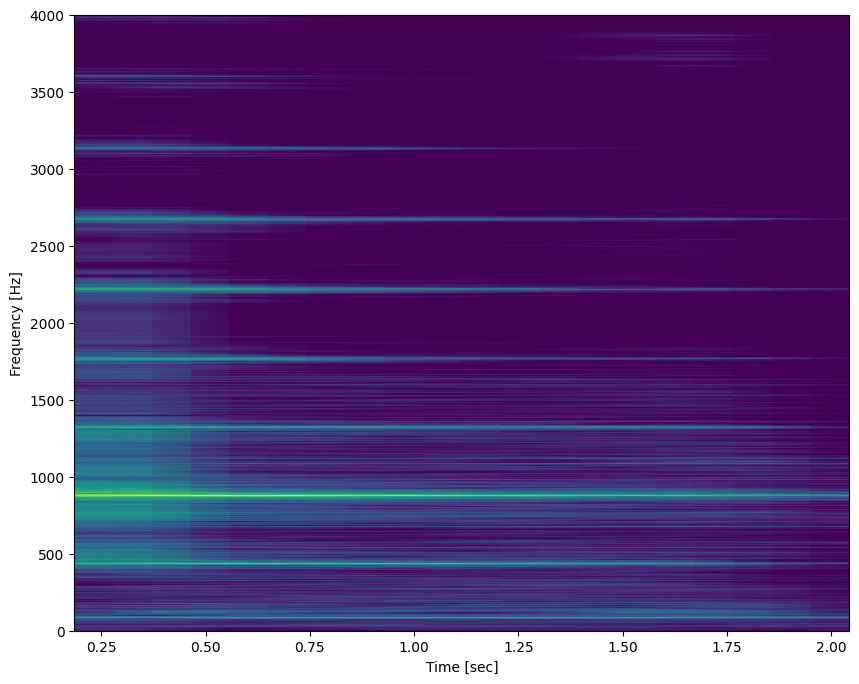

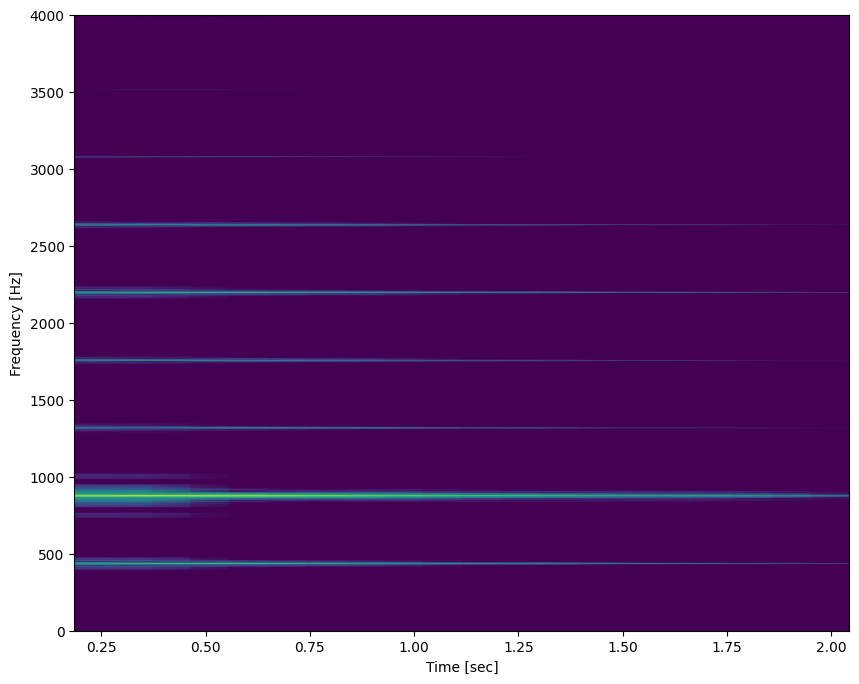

In [48]:
# Plot the spectrogram of the reference signal
window_length = 8192*2
ff, tt, S = signal.spectrogram(ref, fs, nperseg=window_length, noverlap=window_length/2)
plt.figure(figsize=(10,8))
plot_spectrogram(ff, tt, S)
plt.ylim([0, 4000])
plt.show()

# Plot the spectrogram of the synthetized signal
ff, tt, Sy = signal.spectrogram(syn, fs, nperseg=window_length, noverlap=window_length/2)
plt.figure(figsize=(10,8))
plot_spectrogram(ff, tt, Sy)
plt.ylim([0, 4000])
plt.show()

The main difference is that, on the synthetised signal, we can observe more clean frequencies. Furtermore, the noise frequencies near 0 that appear on the original signal does not appear on the synthetized one.

2.7 Listen to the synthesized signal and compare it to the reference.



In [49]:
Audio(syn, rate=fs)

In [50]:
Audio(ref, rate=fs)